In [1]:
import os
import glob
import pandas as pd
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import pastas as ps
from pyextremes import get_extremes

# 0. Compute project root from cwd
cwd = os.getcwd()
project_root = os.path.abspath(os.path.join(cwd, os.pardir))

# 1. Load head‐series excels (skipping header row, parsing day‐first dates)
beemster_dir = os.path.join(project_root, "input_files", "input_beemster")
xlsx_paths = glob.glob(os.path.join(beemster_dir, "*.xlsx"))
head_series = []
for path in xlsx_paths:
    df = pd.read_excel(path,
                       header=None,
                       skiprows=1,
                       usecols=[0,1],
                       names=["timestamp","head"],
                       engine="openpyxl")
    df["timestamp"] = pd.to_datetime(df["timestamp"], dayfirst=True, errors="raise")
    df.set_index("timestamp", inplace=True)
    df = df[~df.index.duplicated(keep="first")]
    name = os.path.splitext(os.path.basename(path))[0]
    head_series.append(df["head"].rename(name))

# Concatenate all head series into a single DataFrame
heads_df = pd.concat(head_series, axis=1)

# Convert head series to meters (assuming the original values are in cm)
heads_df = heads_df / 100

# Building the plotly graph
- We build a plotly graph with two Y axis, also keep in mind that the head series are hourly values and the precipitation dataset is the daily cumulative value.

### Resampling the head series

In [2]:
# Resampling to either max, median or mean
head_resampled = heads_df.resample("D").mean()

# Display the resampled DataFrame info
head_resampled.info()

# Selecting a head series by column name → returns a pandas Series
head = head_resampled['BE0049_00_BIT_GMW_PB2_F-930_EDIT']

# Temp fix
#head = head[head > -5.50]

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 904 entries, 2023-02-01 to 2025-07-23
Freq: D
Data columns (total 19 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   BE0049_00_BIKR_GMW_PB1_F-227      715 non-null    float64
 1   BE0049_00_BIT_GMW_PB1_F-550       713 non-null    float64
 2   BE0049_00_BIT_GMW_PB2_F-930       882 non-null    float64
 3   BE0049_00_BIT_GMW_PB2_F-930_EDIT  859 non-null    float64
 4   BE0049_00_BUKR_GMW_PB1_F-229      823 non-null    float64
 5   BE0049_00_INST_B_GMW_PB1_F-365    882 non-null    float64
 6   BE0280_00_BIKR_GMW_PB1_F-346      752 non-null    float64
 7   BE0280_00_BIT_GMW_PB1_F-592       673 non-null    float64
 8   BE0280_00_BUKR_GMW_PB1_F-350      688 non-null    float64
 9   BE0280_00_INST_B_GMW_PB1_F-461    778 non-null    float64
 10  BE0341_40_BIRK_GMW_PB1_F-1177     903 non-null    float64
 11  BE0341_40_BIRK_GMW_PB1_F-497      904 non-nu

In [3]:
series_name = head.name
print(series_name)

BE0049_00_BIT_GMW_PB2_F-930_EDIT


# Importing Precipitation and Evaporation

In [4]:
# Define project root and input directories
cwd = os.getcwd()
project_root = os.path.abspath(os.path.join(cwd, os.pardir))
precip_file = os.path.join(project_root, "input_files", "input_prec", "prec_station_249.csv")
evap_file = os.path.join(project_root, "input_files", "input_evap", "evap_station_249.csv")

# Import precipitation series
prec_df = pd.read_csv(
    precip_file,
    header=0,
    parse_dates=["DATE"],
    dayfirst=False,
    index_col="DATE",
    usecols=["DATE","Precipitation"]
)
prec_df = prec_df[~prec_df.index.duplicated(keep="first")]
prec_series = prec_df["Precipitation"].rename("prec_station_249")

# Import evaporation series
evap_df = pd.read_csv(
    evap_file,
    header=0,
    parse_dates=["DATE"],
    dayfirst=False,
    index_col="DATE",
    usecols=["DATE","ET"]
)
evap_df = evap_df[~evap_df.index.duplicated(keep="first")]
evap_series = evap_df["ET"].rename("evap_station_249")

In [5]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go

# 1) Create the figure with a secondary y-axis
fig = make_subplots(specs=[[{"secondary_y": True}]])

# 2) Add only your single head series
fig.add_trace(
    go.Scatter(
        x=head.index,
        y=head.values,
        mode="lines",
        marker_color="black",
        name=head.name  # will use the Series’ name, e.g. 'BE0049_00_BIKR_GMW_PB1_F-227'
    ),
    secondary_y=False
)

# 3) Add precipitation as bars on the right axis
fig.add_trace(
    go.Bar(
        x=prec_series.index,
        y=prec_series.values,
        name="Precipitation (daily)",
        marker_color="red",
        opacity=1
    ),
    secondary_y=True
)

# 4) Add evaporation as a line on the right axis
fig.add_trace(
    go.Scatter(
        x=evap_series.index,
        y=evap_series.values,
        mode="lines",
        name="Evaporation (daily)",
        line=dict(color="orange", width=2)
    ),
    secondary_y=True
)

# 5) Axis labels and layout
fig.update_yaxes(title_text="Head (m)", secondary_y=False)
fig.update_yaxes(title_text="Precipitation & Evaporation (mm)", secondary_y=True)

fig.update_layout(
    title=f"{head.name} – Head with Precip & Evap",
    xaxis_title="Date",
    legend=dict(orientation="h", y=1.02, x=1),
    bargap=0.1
)

fig.show()

In [6]:
# Get the first and last valid index of the head series
start_head_observations = head.first_valid_index()
end_head_observations = head.last_valid_index()

# Display the start and end of the head observations
print(start_head_observations)
print(end_head_observations)

# Setting tmin and tmax for all models
manual_tmin = '2023-02-03 00:00:00'
manual_tmax = '2025-06-28 00:00:00'
print("For tmin we are using:", manual_tmin, "and for tmax we are using:", manual_tmax)

2023-02-01 00:00:00
2025-07-01 00:00:00
For tmin we are using: 2023-02-03 00:00:00 and for tmax we are using: 2025-06-28 00:00:00


In [7]:
# Creating a modeel object with the head series
ml1 = ps.Model(head)

## Select a recharge model
rch1 = ps.rch.FlexModel(gw_uptake=True)

# Adding recharge model to the model object
rm1 = ps.RechargeModel(prec_series, evap_series, recharge=rch1, rfunc=ps.DoubleExponential(), name="rch")
ml1.add_stressmodel(rm1)

# Adding a noisemodel to 
#ml1.add_noisemodel(ps.ArmaNoiseModel())

# Adding threshold transform
#ml1.add_transform(ps.ThresholdTransform())

# Solve the model with the specified time range
ml1.solve(initial=True, tmin=manual_tmin, tmax=manual_tmax, report=True, warmup=3650)

The Time Series 'BE0049_00_BIT_GMW_PB2_F-930_EDIT' has nan-values. Pastas will use the fill_nan settings to fill up the nan-values.


Fit report BE0049_00_BIT_GMW_PB2_ Fit Statistics
nfev    19                     EVP         84.13
nobs    854                    R2           0.84
noise   False                  RMSE         0.05
tmin    2023-02-03 00:00:00    AICc     -5229.62
tmax    2025-06-28 00:00:00    BIC      -5182.39
freq    D                      Obj          0.91
warmup  3650 days 00:00:00     ___              
solver  LeastSquares           Interp.        No

Parameters (10 optimized)
                optimal     initial   vary
rch_A          0.064645    0.297459   True
rch_alpha      0.847368    0.100000   True
rch_a1         3.446928   10.000000   True
rch_a2        54.549070   10.000000   True
rch_srmax   1000.000000  250.000000   True
rch_lp         0.250000    0.250000  False
rch_ks      1433.386943  100.000000   True
rch_gamma      0.829438    2.000000   True
rch_kv         0.682813    1.000000   True
rch_simax      2.000000    2.000000  False
rch_gf         1.000000    1.000000   True
constant_d    -3

# Modelling model performances

[<Axes: xlabel='timestamp', ylabel='Head'>,
 <Axes: xlabel='timestamp'>,
 <Axes: title={'right': "Stresses: ['prec_station_249', 'evap_station_249']"}, xlabel='DATE', ylabel='Rise'>,
 <Axes: title={'center': 'Step response'}, xlabel='Time [days]'>,
 <Axes: title={'left': 'Model Parameters ($n_c$=10)'}>]

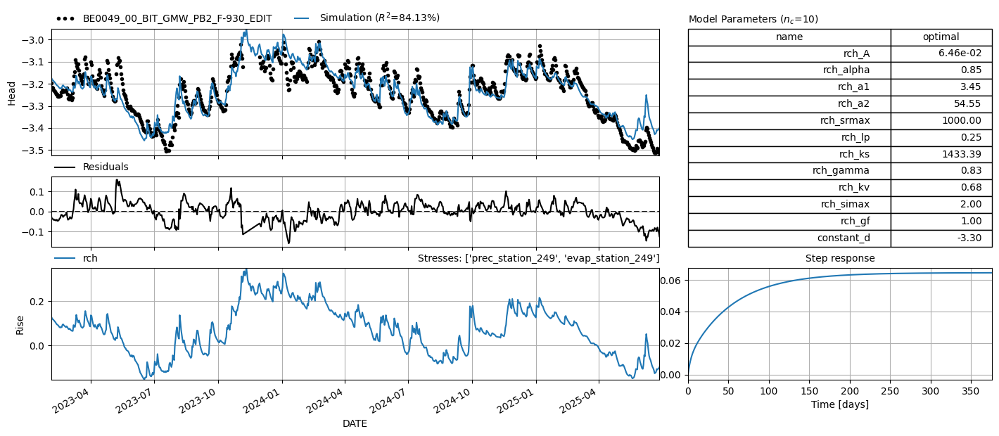

In [8]:
ml1.plots.results(figsize=(14,6))

# Checking for autocorrelation and other model performances

time series does not have regular time steps, the fallback_bin_method'gaussian' is applied


[<Axes: xlabel='Simulated values', ylabel='Residuals'>,
 <Axes: xlabel='Simulated values', ylabel='$\\sqrt{|Residuals|}$'>,
 <Axes: title={'center': 'Residuals (n=854, $\\mu$=-0.00)'}, xlabel='timestamp', ylabel='Residuals'>,
 <Axes: title={'center': 'Histogram'}, ylabel='Probability density'>,
 <Axes: xlabel='Lag [Days]', ylabel='Autocorrelation [-]'>,
 <Axes: title={'center': 'Probability Plot'}, xlabel='Theoretical quantiles', ylabel='Ordered Values'>]

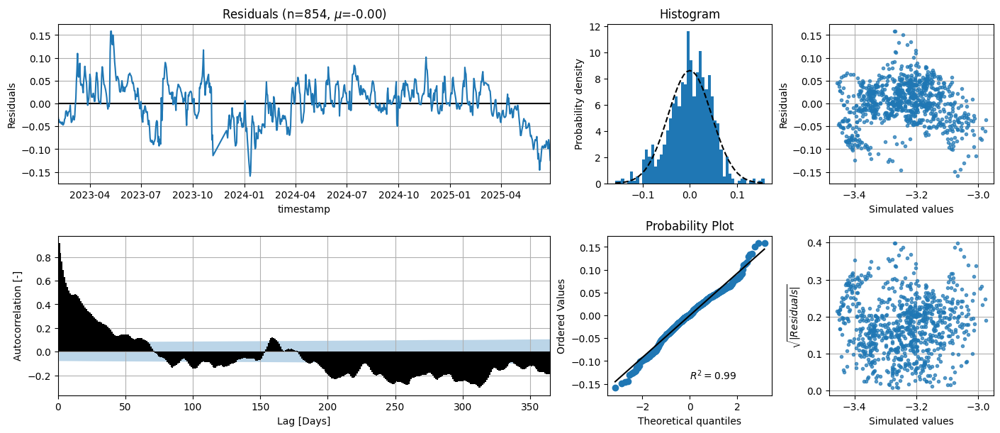

In [9]:
ml1.plots.diagnostics(figsize=(14,6))

In [10]:
print(ml1.stats.diagnostics(alpha=0.05))

                  Checks Statistic P-value  Reject H0 ($\alpha$=0.05)
Shapiroo       Normality      0.99    0.00                       True
D'Agostino     Normality     19.76    0.00                       True
Runs test      Autocorr.    -22.94    0.00                       True
Stoffer-Toloi  Autocorr.   4656.95    0.00                       True


In [11]:
# Function to determine response times for any Pastas Model
def response_time(ml, stress_prefix, parnames, rfunc, cutoff=0.95):
    """
    ml            : a solved Pastas Model
    stress_prefix: e.g. "rch" if your stressmodel is named "rch"
    parnames     : list of parameter suffixes, e.g. ["A","alpha","a1","a2"]
    rfunc        : the response-function instance (DoubleExponential(), etc.)
    cutoff       : fraction of asymptote (0.95 for t95)
    """
    opt = ml.parameters.optimal
    p = tuple(opt[f"{stress_prefix}_{name}"] for name in parnames)
    return rfunc.get_tmax(p=p, cutoff=cutoff)

# Function to determine response times for TarsoModel
def tarso_response_times(ml, cutoff=0.95):
    opt = ml.parameters.optimal
    # Upper reservoir
    t95_0 = ps.Exponential().get_tmax(
        p=(opt["Tarso_A0"], opt["Tarso_a0"]), cutoff=cutoff
    )
    # Lower reservoir
    t95_1 = ps.Exponential().get_tmax(
        p=(opt["Tarso_A1"], opt["Tarso_a1"]), cutoff=cutoff
    )
    return t95_0, t95_1

# Defining Response Times

In [12]:
t95_dexp = response_time(
    ml1,
    stress_prefix="rch",
    parnames=["A","alpha","a1","a2"],
    rfunc=ps.Gamma(),
    cutoff=0.95
)
print(t95_dexp)

9.281396812436332


In [13]:
# Suppose manual_tmin and manual_tmax are strings like "2023-08-01 00:00:00"
start_head__series_date = pd.to_datetime(manual_tmin)
end_head_series_date   = pd.to_datetime(manual_tmax)

# Now subtraction gives you a Timedelta
delta = end_head_series_date - start_head__series_date 

# And you can read off the full days
Tdays = delta.days
print(f"Record length: {Tdays} days")

Record length: 876 days


### Simuleren langjarige grondwaterreeks

In [15]:
# Retrieve series names
name_model = head.name

# Defining the save directory in output_files/models_beemster (absolute path from project_root)
models_beemster_dir = os.path.join(project_root, 'output_files', 'models_beemster')
os.makedirs(models_beemster_dir, exist_ok=True)

# Saving the models in models_beemster folder
ml1.to_file(os.path.join(models_beemster_dir, f"{name_model}_Best_Fit.pas"))

In [16]:
import os
import pandas as pd
from datetime import datetime

# Define project root and input directories
cwd = os.getcwd()
project_root = os.path.abspath(os.path.join(cwd, os.pardir))
precip_dir = os.path.join(project_root, "input_files", "input_prec")
evap_dir = os.path.join(project_root, "input_files", "input_evap")

# File paths
precip_file = os.path.join(precip_dir, "Reeks_regio_R-R.csv")
evap_file = os.path.join(evap_dir, "HUIDIG.xlsx")

# Read precipitation data
prec_df = pd.read_csv(
    precip_file,
    index_col=0,
    header=None,
    names=["prec_R-R"],
    parse_dates=True
)
prec_df.index = pd.to_datetime(prec_df.index)
prec_daily = prec_df.resample("D").sum()

# Read evaporation data
evap_df = pd.read_excel(
    evap_file,
    sheet_name="Verdamping",
    parse_dates=["Datum"],
    index_col=0
)
evap_df = evap_df.rename(columns={"Makkink (mm)": "makkink"})
evap_df.index = pd.to_datetime(evap_df.index)

# Select date range
start = datetime(1906, 1, 1)
end = datetime(2014, 12, 31)

# Assign to variables and convert to meters
prec100 = prec_daily["prec_R-R"][start:end] / 1000
evap100 = evap_df["makkink"][start:end] / 1000

In [17]:
# Define the directory for saving models
models_beemster_dir = os.path.join(project_root, 'output_files', 'models_beemster')
name_model = head.name  # or set manually

# Paths & load saved models
ml1_path = os.path.join(models_beemster_dir, f"{name_model}_Best_Fit.pas")
ml1_loaded = ps.io.load(ml1_path)   # Best Fit (RechargeModel named "rch")
print(f"Loaded model from: {ml1_path}")

# Get calibrated parameters from saved models
p_solved_1 = ml1_loaded.get_parameters()  # Best Fit params

# Climate inputs:
# prec100 / evap100 are in meters/day (as per your earlier code)
prec_m, evap_m = prec100, evap100
# RechargeModel expects mm/day:
prec_mm, evap_mm = prec100 * 1000.0, evap100 * 1000.0

The Time Series 'BE0049_00_BIT_GMW_PB2_F-930_EDIT' has nan-values. Pastas will use the fill_nan settings to fill up the nan-values.


Loaded model from: c:\Users\jeroe\Desktop\Python\pastas-wv2030\output_files\models_beemster\BE0049_00_BIT_GMW_PB2_F-930_EDIT_Best_Fit.pas


In [19]:
# ---------- Best Fit / RechargeModel (mm/day) ----------
ml1_cc = ml1_loaded.copy(name="Best_Fit_climate_timeseries")

# Replace rch stressmodel with current-climate forcing (keep name "rch")
if "rch" in ml1_cc.get_stressmodel_names():
    ml1_cc.del_stressmodel("rch")

sm_rch = ps.RechargeModel(
    prec_mm, evap_mm,
    recharge=ps.rch.FlexModel(gw_uptake=True),
    rfunc=ps.DoubleExponential(),
    name="rch",
)
ml1_cc.add_stressmodel(sm_rch)

# Simulate with calibrated parameters from the saved Best Fit model
sim_bestfit = ml1_cc.simulate(
    p=p_solved_1, tmin="1906", tmax="2013-12-31",
    freq="D", warmup=3650, return_warmup=False
)

The Time Series 'BE0049_00_BIT_GMW_PB2_F-930_EDIT' has nan-values. Pastas will use the fill_nan settings to fill up the nan-values.
The stress of the stressmodel has no overlap with ml.oseries.


In [20]:
# Simple recharge = precipitation - evaporation (mm/day)
recharge_simple = prec_mm - evap_mm

# ---------- Plot with secondary y-axis ----------
fig_bestfit = go.Figure()

# Groundwater level (left y-axis)
fig_bestfit.add_trace(go.Scatter(
    x=sim_bestfit.index, y=sim_bestfit.values,
    mode='lines', name='Simulated (Best Fit, climate)',
    yaxis='y1'
))

# Precipitation (right y-axis, bars)
fig_bestfit.add_trace(go.Bar(
    x=prec_mm.index, y=prec_mm.values,
    name='Precipitation (mm/day)', yaxis='y2', opacity=0.5
))

# Evaporation (right y-axis)
fig_bestfit.add_trace(go.Scatter(
    x=evap_mm.index, y=evap_mm.values,
    mode='lines', name='Evaporation (mm/day)',
    yaxis='y2', line=dict(dash='dot')
))

# Recharge = P - E (right y-axis)
fig_bestfit.add_trace(go.Scatter(
    x=recharge_simple.index, y=recharge_simple.values,
    mode='lines', name='Recharge (P - E, mm/day)',
    yaxis='y2'
))

# Layout with two y-axes
fig_bestfit.update_layout(
    title=f"Best Fit (Recharge) Simulation & Climate Inputs for {name_model}",
    xaxis=dict(title="Date"),
    yaxis=dict(title="Groundwater Level (m)", side="left"),
    yaxis2=dict(
        title="Precipitation / Evaporation / Recharge (mm/day)",
        overlaying='y', side='right'
    ),
    width=1100, height=500,
    legend=dict(x=0.01, y=0.99)
)

fig_bestfit.show()

In [24]:
import numpy as np
import pandas as pd
from scipy.stats import genextreme as gev
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# --- 1) Prep series & AM selection ---
ser = sim_bestfit.dropna().asfreq("D")          # daily spacing (optional but recommended)
annual_min = ser.resample("AS").min().dropna()  # calendar-year minima; use "AS-OCT" for hydro year

# --- 2) Fit GEV to minima via negation (y = -AM) ---
y = -annual_min.values
c, loc_par, scale_par = gev.fit(y)

# --- 3) Return period curve (T in years) ---
T_grid = np.logspace(0, 4.5, 00)  # 1 .. ~30,000
xT_gev = -gev.ppf(1 - 1 / T_grid, c, loc=loc_par, scale=scale_par)

# --- 4) Empirical plotting positions (Gringorten) ---
x_emp = np.sort(annual_min.values)
ranks = np.arange(1, len(annual_min) + 1)
T_emp = (len(annual_min) + 0.12) / (ranks - 0.44)

# --- 5) Build Plotly figure ---
fig = make_subplots(
    rows=1, cols=2, shared_yaxes=True,
    column_widths=[0.6, 0.4],
    horizontal_spacing=0.08,
    subplot_titles=("Tijdreeks + jaarlijkse minima", "Terugkeertijd")
)

# Left panel: full series + AM points
fig.add_trace(
    go.Scatter(
        x=ser.index, y=ser.values, mode="lines",
        name="Reeks",
        hovertemplate="Datum: %{x|%Y-%m-%d}<br>Hoogte: %{y:.3f} m+NAP<extra></extra>"
    ),
    row=1, col=1
)

fig.add_trace(
    go.Scatter(
        x=annual_min.index, y=annual_min.values, mode="markers",
        name=f"AM observaties (N={len(annual_min)})",
        marker=dict(size=6),
        hovertemplate="Jaar: %{x|%Y}<br>AM: %{y:.3f} m+NAP<extra></extra>"
    ),
    row=1, col=1
)

# Right panel: return-period curve + empirical AM points
fig.add_trace(
    go.Scatter(
        x=T_grid, y=xT_gev, mode="lines",
        name=f"GEV (vorm={c:.2f})",
        hovertemplate="T: %{x:.1f} jaar<br>Hoogte: %{y:.3f} m+NAP<extra></extra>"
    ),
    row=1, col=2
)

fig.add_trace(
    go.Scatter(
        x=T_emp, y=x_emp, mode="markers",
        name="AM observaties",
        marker=dict(size=6),
        hovertemplate="T (emp): %{x:.2f} jaar<br>AM: %{y:.3f} m+NAP<extra></extra>"
    ),
    row=1, col=2
)

# --- 6) Layout & axes ---
fig.update_yaxes(title_text="Grondwaterstand (m+NAP)", row=1, col=1)

# Log x-axis on return-period panel
fig.update_xaxes(
    type="log",
    range=[0, np.log10(30000)],  # ~1 to 30,000
    title_text="Terugkeertijd [jaren]",
    row=1, col=2
)

fig.update_layout(
    title_text="Annual Minima - GEV fit (interactief)",
    legend=dict(orientation="h", yanchor="bottom", y=1.02, xanchor="left", x=0),
    margin=dict(l=60, r=20, t=60, b=40),
    hovermode="x unified"
)

fig.show()

C:\Users\jeroe\AppData\Local\Temp\ipykernel_30048\205947264.py:9: FutureWarning:

'AS' is deprecated and will be removed in a future version, please use 'YS' instead.



In [25]:
import numpy as np
import pandas as pd
from scipy.stats import genextreme as gev

def return_levels_AM(sim_bestfit: pd.Series,
                     T_list=(1, 3, 10, 30, 100, 300, 1000),
                     year_rule="AS"):  # use "AS-OCT" for hydrological years
    """
    Compute return levels (groundwater heads, m+NAP) from Annual Minima + GEV.
    sim_bestfit: pandas Series of heads indexed by datetime.
    T_list: iterable of return periods in years.
    year_rule: "AS" (calendar year) or e.g. "AS-OCT" (hydrological).
    """
    # 1) Annual minima
    ser = sim_bestfit.dropna().asfreq("D")
    am = ser.resample(year_rule).min().dropna()
    if len(am) < 5:
        raise ValueError("Too few annual minima (<5) to fit GEV reliably.")

    # 2) Fit GEV to maxima of y = -AM (equivalently minima of AM)
    y = -am.values
    c, loc_par, scale_par = gev.fit(y)

    # 3) Convert return periods -> non-exceedance probs for maxima of y
    #    For T years, p = 1 - 1/T. Avoid p=0/1 edge cases.
    T_arr = np.asarray(T_list, dtype=float)
    p = np.clip(1.0 - 1.0 / T_arr, 1e-9, 1 - 1e-9)

    # 4) Return level in minima domain: x_T = -GEV_y.ppf(p)
    xT = -gev.ppf(p, c, loc=loc_par, scale=scale_par)

    # Package results
    out = pd.DataFrame({"head_mNAP": xT}, index=pd.Index(T_arr, name="T_years"))
    params = {"shape": c, "loc_y": loc_par, "scale_y": scale_par,
              "n_years": len(am), "year_rule": year_rule}
    return out, params

# ---- Use it ----
Ts = [1, 3, 10, 30, 100, 300, 1000]
rl_table, gev_params = return_levels_AM(sim_bestfit, T_list=Ts, year_rule="AS")
print(rl_table)
print("GEV params (fitted on y=-AM):", gev_params)

         head_mNAP
T_years           
1.0      -3.175588
3.0      -3.350904
10.0     -3.374327
30.0     -3.387334
100.0    -3.396772
300.0    -3.402581
1000.0   -3.406912
GEV params (fitted on y=-AM): {'shape': np.float64(0.3330129642412245), 'loc_y': np.float64(3.32818672407065), 'scale_y': np.float64(0.02913703178823847), 'n_years': 108, 'year_rule': 'AS'}


C:\Users\jeroe\AppData\Local\Temp\ipykernel_30048\3820915371.py:16: FutureWarning:

'AS' is deprecated and will be removed in a future version, please use 'YS' instead.



In [27]:
def get_mins_pot(df, thresh=0.1, window=30):
    df = -df
    extremes = get_extremes(df, "POT", threshold=df.quantile(thresh), r=f"{window}D")
    minima = -extremes

    b_plot = 0.44
    T_per = (df.index[-1] - df.index[0]).total_seconds() / 3600 / 24 / 365
    h_pot = minima.sort_values(ascending=False)
    T_pot = np.flip(
        calc_return_period_pot(h_pot, Tper=T_per, a=b_plot, b=(1 - 2 * b_plot))
    )

    return minima, T_per, T_pot, h_pot


def calc_return_period_pot(maxima, Tper, a=0.3, b=0.4, n=None):
    # Sort peak values in descending order
    order = np.argsort(maxima)[::-1]
    maxima = np.sort(maxima)[::-1]

    # If not provided, use the full length of maxima
    if n is None:
        n = len(maxima)

    # Compute plotting positions
    k = np.arange(len(maxima)) + 1
    P = (n * (k + a + b - 1)) / ((n + b) * Tper)  # Probability of exceedance
    T = 1.0 / P  # Return period (years)

    return T[np.argsort(order)]  # Restore original order


def give_vfit_ffit_exp(minima, T_per, Ts, hs, Tthresh):
    minima = -minima
    hs = -hs

    mask = Ts > Tthresh
    params = expon.fit(hs[mask])  # fit exonentiele verdeling

    pfit = np.exp(np.arange(np.log(1e-5), np.log(1), 0.1))  # maak kansen raster
    vfit = expon.ppf(
        1 - pfit, *params
    )  # geeft de geschatte waarde bij de opgegeven overschrijdingskansen
    ffit = pfit * (
        len(hs[mask]) / T_per
    )  # schaling van de extreme waarde verdeling door freqenties aan te passen

    fnew = pfit
    df_freq = pd.DataFrame(index=ffit, data=vfit, columns=["headvalues"]).dropna()
    vnew = bepaal_hoogte(df_freq.index.values, df_freq.headvalues.values, fnew)
    vnew = -vnew
    return vnew, fnew, params


def give_vfit_ffit_gpv(minima, T_per, Ts, hs, Tthresh):
    minima = -minima
    hs = -hs

    mask = Ts > Tthresh
    params = genpareto.fit(hs[mask], floc=min(data_fit))

    pfit = np.exp(np.arange(np.log(1e-5), np.log(1), 0.1))  # maak kansen raster
    vfit = genpareto.ppf(1 - pfit, *params)
    ffit = pfit * (len(hs[mask]) / T_per)

    fnew = pfit
    df_freq = pd.DataFrame(index=ffit, data=vfit, columns=["headvalues"]).dropna()
    vnew = bepaal_hoogte(df_freq.index.values, df_freq.headvalues.values, fnew)
    vnew = -vnew
    return vnew, fnew, params


def give_vfit_ffit_gev(minima, T_per, Ts, hs, Tthresh):
    minima = minima
    hs = hs

    mask = Ts > Tthresh
    params = genextreme.fit(
        hs[mask]
    )  # f0=-0.3, floc=10620, scale=300)#, -.8, loc=10480, scale=300)
    pfit = np.exp(np.arange(np.log(1e-5), np.log(1), 0.1))
    vfit = genextreme.ppf(pfit, *params)
    ffit = pfit * (len(hs[mask]) / T_per)

    fnew = pfit
    df_freq = pd.DataFrame(index=ffit, data=vfit, columns=["headvalues"]).dropna()
    vnew = bepaal_hoogte(df_freq.index.values, df_freq.headvalues.values, fnew)
    vnew = vnew
    return vnew, fnew, params

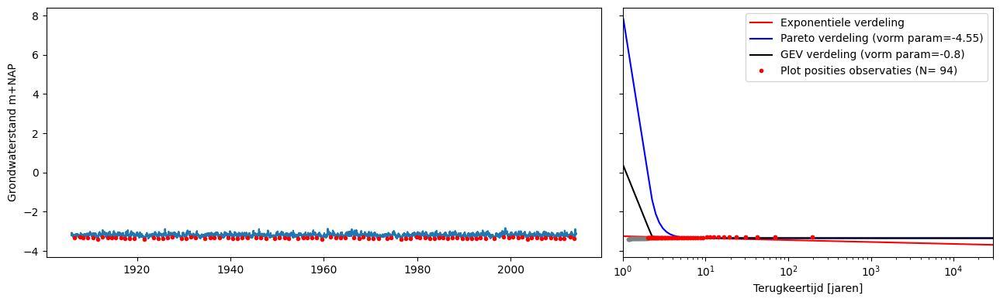

In [33]:
import numpy as np
import pandas as pd
from scipy.interpolate import interp1d
from scipy.stats import expon, genpareto, genextreme
import matplotlib.pyplot as plt

# ---------- helpers ----------
def bepaal_hoogte(fp, xp, f):
    """Log-linear interpolation of value vs frequency.
    Accepts scalar or array f, returns ndarray with same shape."""
    fp = np.asarray(fp)
    xp = np.asarray(xp)
    f  = np.asarray(f)
    fint = interp1d(np.log(fp), xp, fill_value="extrapolate")
    return fint(np.log(f))

def calc_return_period_pot(maxima, Tper, a=0.3, b=0.4, n=None):
    # Sort descending, compute plotting positions, then map back to original order
    order = np.argsort(maxima)[::-1]
    maxima_sorted = np.sort(maxima)[::-1]
    if n is None:
        n = len(maxima_sorted)
    k = np.arange(len(maxima_sorted)) + 1
    P = (n * (k + a + b - 1)) / ((n + b) * Tper)  # exceedance prob
    T = 1.0 / P                                   # return period (years)
    # return in the same order as 'maxima' input
    inv = np.empty_like(order)
    inv[order] = np.arange(len(order))
    return T[inv]

def get_mins_pot(series, thresh=0.1, window=30):
    # Expect a pandas Series with DateTimeIndex
    df = -series
    extremes = get_extremes(df, "POT", threshold=df.quantile(thresh), r=f"{window}D")
    minima = -extremes

    b_plot = 0.44
    T_per = (df.index[-1] - df.index[0]).total_seconds() / (3600 * 24 * 365)
    h_pot = minima.sort_values(ascending=False).copy()
    T_pot = calc_return_period_pot(h_pot.values, Tper=T_per, a=b_plot, b=(1 - 2 * b_plot))
    # T_pot aligns with h_pot.values (same order)
    return minima, T_per, T_pot, h_pot

def give_vfit_ffit_exp(minima, T_per, Ts, hs, Tthresh):
    minima = -minima
    hs = -hs
    mask = Ts > Tthresh
    params = expon.fit(hs[mask])  # exponential fit

    pfit = np.exp(np.arange(np.log(1e-5), np.log(1.0), 0.1))  # frequency grid (exceedance prob)
    vfit = expon.ppf(1 - pfit, *params)
    ffit = pfit * (len(hs[mask]) / T_per)

    fnew = pfit
    df_freq = pd.DataFrame(index=ffit, data=vfit, columns=["headvalues"]).dropna()
    vnew = bepaal_hoogte(df_freq.index.values, df_freq.headvalues.values, fnew)
    vnew = -vnew
    return vnew, fnew, params

def give_vfit_ffit_gpv(minima, T_per, Ts, hs, Tthresh):
    minima = -minima
    hs = -hs
    mask = Ts > Tthresh
    # Either let loc float (recommended) or fix at observed minimum:
    # params = genpareto.fit(hs[mask], floc=np.min(hs[mask]))
    params = genpareto.fit(hs[mask])

    pfit = np.exp(np.arange(np.log(1e-5), np.log(1.0), 0.1))
    vfit = genpareto.ppf(1 - pfit, *params)
    ffit = pfit * (len(hs[mask]) / T_per)

    fnew = pfit
    df_freq = pd.DataFrame(index=ffit, data=vfit, columns=["headvalues"]).dropna()
    vnew = bepaal_hoogte(df_freq.index.values, df_freq.headvalues.values, fnew)
    vnew = -vnew
    return vnew, fnew, params

def give_vfit_ffit_gev(minima, T_per, Ts, hs, Tthresh):
    # Here we don't flip signs: model on the actual hs selected by T threshold
    mask = Ts > Tthresh
    params = genextreme.fit(hs[mask])

    pfit = np.exp(np.arange(np.log(1e-5), np.log(1.0), 0.1))
    vfit = genextreme.ppf(pfit, *params)
    ffit = pfit * (len(hs[mask]) / T_per)

    fnew = pfit
    df_freq = pd.DataFrame(index=ffit, data=vfit, columns=["headvalues"]).dropna()
    vnew = bepaal_hoogte(df_freq.index.values, df_freq.headvalues.values, fnew)
    return vnew, fnew, params

# ---------- run using sim_bestfit ----------
# POT selectie
Htrhresh_quant = 0.8
window = 183
# Drempelwaarde voor kansverdeling
Tthresh = 2

# Use sim_bestfit directly (Series or single-col DataFrame)
df = sim_bestfit
if isinstance(df, pd.DataFrame):
    if df.shape[1] != 1:
        raise ValueError("sim_bestfit must be a Series or a single-column DataFrame.")
    df = df.iloc[:, 0]
df = df.dropna().sort_index()
if not isinstance(df.index, pd.DatetimeIndex):
    raise TypeError("sim_bestfit index must be a DatetimeIndex.")

# Run POT extraction
minima, Tper, Tp, hp = get_mins_pot(df, thresh=Htrhresh_quant, window=window)

# Fit distributions
heads,     freq,     params_exp = give_vfit_ffit_exp(minima, Tper, Tp, hp.values, Tthresh=Tthresh)
heads_gpv, freq_gpv, params_gpv = give_vfit_ffit_gpv(minima, Tper, Tp, hp.values, Tthresh=Tthresh)
c = params_gpv[0]  # shape parameter

heads_gev, freq_gev, params_gev = give_vfit_ffit_gev(minima, Tper, Tp, hp.values, Tthresh=Tthresh)
c_gev = params_gev[0]

# ---------- plotting ----------
fig, (ax, ax1) = plt.subplots(
    1, 2, figsize=(13, 4), gridspec_kw={"width_ratios": [1.5, 1]}, sharey=True
)

ax.plot(df)
ax.plot(minima, "o", color="r", markersize=3)
ax.set_ylabel("Grondwaterstand m+NAP")

ax1.plot(1 / freq,     heads,     color="r", label="Exponentiele verdeling")
ax1.plot(1 / freq_gpv, heads_gpv, color="b", label=f"Pareto verdeling (vorm param={round(float(c), 2)})")
ax1.plot(1 / freq_gev, heads_gev, color="k", label=f"GEV verdeling (vorm param={round(float(c_gev), 2)})")

ax1.plot(Tp, hp.values, "o", color="grey", markersize=3)
ax1.plot(Tp[Tp > Tthresh], hp.values[Tp > Tthresh], "o", color="r", markersize=3,
         label=f"Plot posities observaties (N= {len(hp)})")

ax1.legend()
ax1.set_xlim(1, 30000)
ax1.set_xlabel("Terugkeertijd [jaren]")
ax1.set_xscale("log")
plt.tight_layout()

In [35]:
import numpy as np
import pandas as pd
from plotly.subplots import make_subplots
import plotly.graph_objects as go

# ------ everything below assumes you've already run your helpers and setup above ------
# i.e., you already have:
# - sim_bestfit (Series or 1-col DataFrame with DatetimeIndex)
# - get_mins_pot, give_vfit_ffit_exp, give_vfit_ffit_gpv, give_vfit_ffit_gev, etc.

def make_plotly_figure(
    sim_bestfit,
    Htrhresh_quant=0.8,
    window=180,
    Tthresh=2,
):
    # Normalize input (as in your script)
    df = sim_bestfit
    if isinstance(df, pd.DataFrame):
        if df.shape[1] != 1:
            raise ValueError("sim_bestfit must be a Series or a single-column DataFrame.")
        df = df.iloc[:, 0]
    df = df.dropna().sort_index()
    if not isinstance(df.index, pd.DatetimeIndex):
        raise TypeError("sim_bestfit index must be a DatetimeIndex.")

    # Run POT extraction and fits (your own functions)
    minima, Tper, Tp, hp = get_mins_pot(df, thresh=Htrhresh_quant, window=window)

    heads,     freq,     params_exp = give_vfit_ffit_exp(minima, Tper, Tp, hp.values, Tthresh=Tthresh)
    heads_gpv, freq_gpv, params_gpv = give_vfit_ffit_gpv(minima, Tper, Tp, hp.values, Tthresh=Tthresh)
    c = float(params_gpv[0])

    heads_gev, freq_gev, params_gev = give_vfit_ffit_gev(minima, Tper, Tp, hp.values, Tthresh=Tthresh)
    c_gev = float(params_gev[0])

    # Return period arrays (x-axis in right panel)
    rp_exp = 1.0 / freq
    rp_gpv = 1.0 / freq_gpv
    rp_gev = 1.0 / freq_gev

    # Build Plotly figure (two columns, shared y)
    fig = make_subplots(
        rows=1, cols=2,
        shared_yaxes=True,
        column_widths=[0.6, 0.4],
        horizontal_spacing=0.08,
        subplot_titles=("Tijdreeks & POT-minima", "Frequentielijn (log x)")
    )

    # --- Left panel (time series + minima points) ---
    fig.add_trace(
        go.Scatter(
            x=df.index, y=df.values,
            mode="lines",
            name="Grondwaterstand",
            hovertemplate="Datum: %{x|%Y-%m-%d}<br>m+NAP: %{y:.3f}<extra></extra>",
        ),
        row=1, col=1
    )

    fig.add_trace(
        go.Scatter(
            x=minima.index, y=minima.values,
            mode="markers",
            name="POT-minima",
            marker=dict(size=6, color="red"),
            hovertemplate="Datum: %{x|%Y-%m-%d}<br>Min: %{y:.3f}<extra></extra>",
        ),
        row=1, col=1
    )

    # --- Right panel (frequency curves + plot positions) ---
    fig.add_trace(
        go.Scatter(
            x=rp_exp, y=heads,
            mode="lines",
            name="Exponentiële verdeling",
            line=dict(width=2, color="red"),
            hovertemplate="T (jaar): %{x:.2f}<br>m+NAP: %{y:.3f}<extra></extra>",
        ),
        row=1, col=2
    )

    fig.add_trace(
        go.Scatter(
            x=rp_gpv, y=heads_gpv,
            mode="lines",
            name=f"Pareto verdeling (vorm param={round(c, 2)})",
            line=dict(width=2, color="blue"),
            hovertemplate="T (jaar): %{x:.2f}<br>m+NAP: %{y:.3f}<extra></extra>",
        ),
        row=1, col=2
    )

    fig.add_trace(
        go.Scatter(
            x=rp_gev, y=heads_gev,
            mode="lines",
            name=f"GEV verdeling (vorm param={round(c_gev, 2)})",
            line=dict(width=2, color="black"),
            hovertemplate="T (jaar): %{x:.2f}<br>m+NAP: %{y:.3f}<extra></extra>",
        ),
        row=1, col=2
    )

    # Plot positions (grey) and those above Tthresh (red) — like your Matplotlib code
    fig.add_trace(
        go.Scatter(
            x=Tp, y=hp.values,
            mode="markers",
            name="Plot posities observaties",
            marker=dict(size=6, color="grey"),
            hovertemplate="T (jaar): %{x:.2f}<br>m+NAP: %{y:.3f}<extra></extra>",
        ),
        row=1, col=2
    )

    mask_T = Tp > Tthresh
    fig.add_trace(
        go.Scatter(
            x=Tp[mask_T], y=hp.values[mask_T],
            mode="markers",
            name=f"Plot posities observaties (N={len(hp)})",
            marker=dict(size=7, color="red", symbol="circle-open"),
            hovertemplate="T (jaar): %{x:.2f}<br>m+NAP: %{y:.3f}<extra></extra>",
        ),
        row=1, col=2
    )

    # Layout / axes
    fig.update_yaxes(title_text="Grondwaterstand [m+NAP]", row=1, col=1)
    fig.update_xaxes(title_text="Datum", row=1, col=1)

    fig.update_xaxes(
        title_text="Terugkeertijd [jaren]",
        type="log",
        range=[0, np.log10(3e4)],  # ~ [1, 30000] in log space
        row=1, col=2
    )

    fig.update_layout(
        template="plotly_white",
        legend=dict(orientation="h", yanchor="bottom", y=-0.15, xanchor="left", x=0),
        margin=dict(l=60, r=30, t=60, b=60),
    )

    return fig

# Usage:
fig = make_plotly_figure(sim_bestfit, Htrhresh_quant=0.8, window=180, Tthresh=2)
fig.show()


In [31]:
# Define target return periods in years
target_T = np.array([1, 10, 250, 500, 1000])
target_freq = 1 / target_T  # exceedance probability

def get_return_levels(freq, heads, target_freq):
    """Interpolate fitted curve to get heads at given target exceedance probabilities."""
    # Ensure sorted ascending by frequency for interpolation
    sort_idx = np.argsort(freq)
    freq_sorted = freq[sort_idx]
    heads_sorted = heads[sort_idx]
    return bepaal_hoogte(freq_sorted, heads_sorted, target_freq)

# Calculate return levels
ret_exp = get_return_levels(freq,     heads,     target_freq)
ret_gpv = get_return_levels(freq_gpv, heads_gpv, target_freq)
ret_gev = get_return_levels(freq_gev, heads_gev, target_freq)

# Combine into a DataFrame for display
df_return_levels = pd.DataFrame({
    "T_years": target_T,
    "Exponential": ret_exp,
    "GenPareto": ret_gpv,
    "GEV": ret_gev
}).set_index("T_years")

print(df_return_levels)

         Exponential  GenPareto       GEV
T_years                                  
1          -3.247752   7.969360  0.403088
10         -3.345972  -3.342064 -3.338650
250        -3.483277  -3.344313 -3.345319
500        -3.512845  -3.344313 -3.345800
1000       -3.542412  -3.344313 -3.346182
